# **1. Import files & libaries**

In [143]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
from scipy.stats import kruskal
sb.set() # set the default Seaborn style for graphics

import warnings
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)

from sklearn.metrics import r2_score, mean_squared_error


In [144]:
# Load CSV directly from Google Drive
original_df = pd.read_csv("misc\CTG_rawdata.csv")
original_df.head(3)

# Preview first 3 rows
original_df.head(3)


<>:2: SyntaxWarning: invalid escape sequence '\C'
<>:2: SyntaxWarning: invalid escape sequence '\C'
C:\Users\marcu\AppData\Local\Temp\ipykernel_29432\1482233206.py:2: SyntaxWarning: invalid escape sequence '\C'
  original_df = pd.read_csv("misc\CTG_rawdata.csv")


,FileName,Date,SegFile,b,e,LBE,LB,AC,FM,UC,...,C,D,E,AD,DE,LD,FS,SUSP,CLASS,NSP
0,Variab10.txt,1/12/1996,CTG0001.txt,240.0,357.0,120.0,120.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,9.0,2.0
1,Fmcs_1.txt,3/5/1996,CTG0002.txt,5.0,632.0,132.0,132.0,4.0,0.0,4.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,1.0
2,Fmcs_1.txt,3/5/1996,CTG0003.txt,177.0,779.0,133.0,133.0,2.0,0.0,5.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,1.0


In [145]:
original_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2129 entries, 0 to 2128
Data columns (total 40 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   FileName  2126 non-null   object 
 1   Date      2126 non-null   object 
 2   SegFile   2126 non-null   object 
 3   b         2126 non-null   float64
 4   e         2126 non-null   float64
 5   LBE       2126 non-null   float64
 6   LB        2126 non-null   float64
 7   AC        2126 non-null   float64
 8   FM        2127 non-null   float64
 9   UC        2127 non-null   float64
 10  ASTV      2127 non-null   float64
 11  MSTV      2127 non-null   float64
 12  ALTV      2127 non-null   float64
 13  MLTV      2127 non-null   float64
 14  DL        2128 non-null   float64
 15  DS        2128 non-null   float64
 16  DP        2128 non-null   float64
 17  DR        2128 non-null   float64
 18  Width     2126 non-null   float64
 19  Min       2126 non-null   float64
 20  Max       2126 non-null   floa

In [146]:
original_df.shape

(2129, 40)

# **2. Dataframe summary**


| #  | dataframe   | description |
|----|-------------|-------------|
| 1  | **FileName** | CTG examination file name |
| 2  | **Date**     | date of the examination |
| 3  | **SegFile**  | name of the segment file |
| 4  | **b**        | start instant |
| 5  | **e**        | end instant |
| 6  | **LBE**      | baseline value (medical expert) |
| 7  | **LB**       | baseline value (SisPorto) |
| 8  | **AC**       | accelerations (SisPorto) |
| 9  | **FM**       | foetal movement (SisPorto) |
| 10 | **UC**       | uterine contractions (SisPorto) |
| 11 | **ASTV**     | % of time with abnormal short term variability (SisPorto) |
| 12 | **mSTV**     | mean short term variability (SisPorto) |
| 13 | **ALTV**     | % of time with abnormal long term variability (SisPorto) |
| 14 | **mLTV**     | mean long term variability (SisPorto) |
| 15 | **DL**       | light decelerations |
| 16 | **DS**       | severe decelerations |
| 17 | **DP**       | prolonged decelerations |
| 18 | **DR**       | repetitive decelerations |
| 19 | **Width**    | histogram width |
| 20 | **Min**      | low freq. of the histogram |
| 21 | **Max**      | high freq. of the histogram |
| 22 | **Nmax**     | number of histogram peaks |
| 23 | **Nzeros**   | number of histogram zeros |
| 24 | **Mode**     | histogram mode |
| 25 | **Mean**     | histogram mean |
| 26 | **Median**   | histogram median |
| 27 | **Variance** | histogram variance |
| 28 | **Tendency** | histogram tendency (-1=left asymmetric; 0=symmetric; 1=right asymmetric) |
| 29 | **A**        | calm sleep |
| 30 | **B**        | REM sleep |
| 31 | **C**        | calm vigilance |
| 32 | **D**        | active vigilance |
| 33 | **SH**       | shift pattern (A or Susp with shifts) |
| 34 | **AD**       | accelerative/decelerative pattern (stress situation) |
| 35 | **DE**       | decelerative pattern (vagal stimulation) |
| 36 | **LD**       | largely decelerative pattern |
| 37 | **FS**       | flat-sinusoidal pattern (pathological state) |
| 38 | **SUSP**     | suspect pattern |
| 39 | **CLASS**    | class code (1–10) for classes A to SUSP |
| 40 | **NSP**      | Normal = 1; Suspect = 2; Pathologic = 3 |


From the provided descriptions, we see that the features are grouped by the following:
*   Dataset info: 1 to 5
*   Clinical data: feature 6 to 10 & feature 15 to 18
*   Variability metrics: feature 11 to 14
*   Histogram data: feature 19 to 28
*   Class categories: feature 29 to 40

We do not require all the columns and can drop/keep them in a seperate dataframe in the next section.


# **3 Data cleaning**

**CHECKING FOR DUPLICATES**

Assuming each name in 'SegFile' variable are linked to a unique datapoint, we can use it to check for duplicates.

In [152]:
# Check total rows vs unique SegFile entries
total_rows = original_df.shape[0]
unique_segfiles = original_df["SegFile"].nunique()

print(f"Total rows: {total_rows}")
print(f"Unique SegFile values: {unique_segfiles}")

# Check for duplicates
duplicates = original_df[original_df.duplicated(subset=["SegFile"], keep=False)]

display(duplicates)


Total rows: 2129
Unique SegFile values: 2126


,FileName,Date,SegFile,b,e,LBE,LB,AC,FM,UC,...,C,D,E,AD,DE,LD,FS,SUSP,CLASS,NSP
2126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,564.0,23.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There shows to be no dupulicated SegFile names, other than 'NaN' which we will soon drop.

**DROPPING 'NaN' VALUES**

Rows with invalid 'NaN' values are dropped.

In [156]:
cleaned_df = original_df.dropna().reset_index(drop=True)
cleaned_df


,FileName,Date,SegFile,b,e,LBE,LB,AC,FM,UC,...,C,D,E,AD,DE,LD,FS,SUSP,CLASS,NSP
0,Variab10.txt,1/12/1996,CTG0001.txt,240.0,357.0,120.0,120.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,9.0,2.0
1,Fmcs_1.txt,3/5/1996,CTG0002.txt,5.0,632.0,132.0,132.0,4.0,0.0,4.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,1.0
2,Fmcs_1.txt,3/5/1996,CTG0003.txt,177.0,779.0,133.0,133.0,2.0,0.0,5.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,1.0
3,Fmcs_1.txt,3/5/1996,CTG0004.txt,411.0,1192.0,134.0,134.0,2.0,0.0,6.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,1.0
4,Fmcs_1.txt,3/5/1996,CTG0005.txt,533.0,1147.0,132.0,132.0,4.0,0.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,S8001045.dsp,6/6/1998,CTG2124.txt,2059.0,2867.0,140.0,140.0,0.0,0.0,6.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,2.0
2122,S8001045.dsp,6/6/1998,CTG2125.txt,1576.0,2867.0,140.0,140.0,1.0,0.0,9.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,2.0
2123,S8001045.dsp,6/6/1998,CTG2126.txt,1576.0,2596.0,140.0,140.0,1.0,0.0,7.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,2.0
2124,S8001045.dsp,6/6/1998,CTG2127.txt,1576.0,3049.0,140.0,140.0,1.0,0.0,9.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,2.0


**DROPPING UNWATED COLUMNS**

For our study, we are looking at NSP class (Normal/Suspect/Path) only. Thus, other class categories (feature 28 to 38) are dropped.

The only dataset info that is useful are 'b' (start instant) and 'e' (end instant). We will drop feature 1 & 2.

As for the numerical data, feature 'DL' (Light Decelerations) seem to all be zero. Since we cannot derive anything meaningful, feature 15 is also dropped.


We will keep every other variable as they are worth investigating.

In [158]:
keep_cols = [
    "b", "e", "LB", "LBE", "AC", "FM", "UC", "DS", "DP", "DR",
    "ASTV", "MSTV", "ALTV", "MLTV",
    "Width", "Min", "Max", "Nmax", "Nzeros",
    "Mode", "Mean", "Median", "Variance", "Tendency",
    "NSP"   # keep target
]

dropped_df = cleaned_df[keep_cols]

dropped_df

,b,e,LB,LBE,AC,FM,UC,DS,DP,DR,...,Min,Max,Nmax,Nzeros,Mode,Mean,Median,Variance,Tendency,NSP
0,240.0,357.0,120.0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,5.0,632.0,132.0,132.0,4.0,0.0,4.0,0.0,0.0,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,177.0,779.0,133.0,133.0,2.0,0.0,5.0,0.0,0.0,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,411.0,1192.0,134.0,134.0,2.0,0.0,6.0,0.0,0.0,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,533.0,1147.0,132.0,132.0,4.0,0.0,5.0,0.0,0.0,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,2059.0,2867.0,140.0,140.0,0.0,0.0,6.0,0.0,0.0,0.0,...,137.0,177.0,4.0,0.0,153.0,150.0,152.0,2.0,0.0,2.0
2122,1576.0,2867.0,140.0,140.0,1.0,0.0,9.0,0.0,0.0,0.0,...,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0,2.0
2123,1576.0,2596.0,140.0,140.0,1.0,0.0,7.0,0.0,0.0,0.0,...,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0,2.0
2124,1576.0,3049.0,140.0,140.0,1.0,0.0,9.0,0.0,0.0,0.0,...,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0,2.0


**RENAMING HISTOGRAM FEATURES**

For the sake of clarity, each histogram feature is to be named 'H_xxx'.

In [160]:
# Dictionary for renaming
histogram_rename = {
    "Width": "H_Width",
    "Min": "H_Min",
    "Max": "H_Max",
    "Nmax": "H_Nmax",
    "Nzeros": "H_Nzeros",
    "Mode": "H_Mode",
    "Mean": "H_Mean",
    "Median": "H_Median",
    "Variance": "H_Variance",
    "Tendency": "H_Tendency"
}

# Apply renaming to final_df
dropped_df = dropped_df.rename(columns=histogram_rename)

# Preview
dropped_df.head()


,b,e,LB,LBE,AC,FM,UC,DS,DP,DR,...,H_Min,H_Max,H_Nmax,H_Nzeros,H_Mode,H_Mean,H_Median,H_Variance,H_Tendency,NSP
0,240.0,357.0,120.0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,5.0,632.0,132.0,132.0,4.0,0.0,4.0,0.0,0.0,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,177.0,779.0,133.0,133.0,2.0,0.0,5.0,0.0,0.0,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,411.0,1192.0,134.0,134.0,2.0,0.0,6.0,0.0,0.0,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,533.0,1147.0,132.0,132.0,4.0,0.0,5.0,0.0,0.0,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


**FINAL CHECKS**

Next we will check if data types are correct. They should be float64.

In [162]:
dropped_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 25 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   b           2126 non-null   float64
 1   e           2126 non-null   float64
 2   LB          2126 non-null   float64
 3   LBE         2126 non-null   float64
 4   AC          2126 non-null   float64
 5   FM          2126 non-null   float64
 6   UC          2126 non-null   float64
 7   DS          2126 non-null   float64
 8   DP          2126 non-null   float64
 9   DR          2126 non-null   float64
 10  ASTV        2126 non-null   float64
 11  MSTV        2126 non-null   float64
 12  ALTV        2126 non-null   float64
 13  MLTV        2126 non-null   float64
 14  H_Width     2126 non-null   float64
 15  H_Min       2126 non-null   float64
 16  H_Max       2126 non-null   float64
 17  H_Nmax      2126 non-null   float64
 18  H_Nzeros    2126 non-null   float64
 19  H_Mode      2126 non-null  

Data types are healthy as desired.

Lastly, we will check if 'Tendency' and 'NSP' have values anything other than (-1, 0, 1) and (1, 2, 3) respectively.

In [164]:
print("Unique values in Tendency:", dropped_df["H_Tendency"].unique())
print("Unique values in NSP:", dropped_df["NSP"].unique())

Unique values in Tendency: [ 1.  0. -1.]
Unique values in NSP: [2. 1. 3.]


The labels are also as expected. The dataset is now ready for further manipulation.

# **4 Feature engineering**

**Creating 'runtime' column**

Since we have start instant (b) and end instant (e), we can calculate the runtime of the data collection.

In [169]:
final_df = dropped_df.copy()

# Create runtime column
final_df["runtime"] = original_df["e"] - original_df["b"]

final_df.head()


,b,e,LB,LBE,AC,FM,UC,DS,DP,DR,...,H_Max,H_Nmax,H_Nzeros,H_Mode,H_Mean,H_Median,H_Variance,H_Tendency,NSP,runtime
0,240.0,357.0,120.0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,...,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0,117.0
1,5.0,632.0,132.0,132.0,4.0,0.0,4.0,0.0,0.0,0.0,...,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0,627.0
2,177.0,779.0,133.0,133.0,2.0,0.0,5.0,0.0,0.0,0.0,...,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0,602.0
3,411.0,1192.0,134.0,134.0,2.0,0.0,6.0,0.0,0.0,0.0,...,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0,781.0
4,533.0,1147.0,132.0,132.0,4.0,0.0,5.0,0.0,0.0,0.0,...,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0,614.0


**Creating 'X_rate' feature**

With runtime feature, we make use of it to normalise our data. However, not every variable should be normalised by this (ie, ASTV, ALTV, mSTV, mLTV, all histogram data)

We will call our new normalised data 'X_rate', where X is the variable to be converted to rate form.

In [171]:
# Event count features to normalize
event_features = ["AC", "FM", "UC", "DS", "DP", "DR"]

# Create normalized versions (per unit runtime)
for var in event_features:
    final_df[f"{var}_rate"] = final_df[var] / final_df["runtime"]

# Drop the old raw count columns
final_df = final_df.drop(columns=event_features)

final_df.head()

,b,e,LB,LBE,ASTV,MSTV,ALTV,MLTV,H_Width,H_Min,...,H_Variance,H_Tendency,NSP,runtime,AC_rate,FM_rate,UC_rate,DS_rate,DP_rate,DR_rate
0,240.0,357.0,120.0,120.0,73.0,0.5,43.0,2.4,64.0,62.0,...,73.0,1.0,2.0,117.0,0.000000,0.0,0.000000,0.0,0.0,0.0
1,5.0,632.0,132.0,132.0,17.0,2.1,0.0,10.4,130.0,68.0,...,12.0,0.0,1.0,627.0,0.006380,0.0,0.006380,0.0,0.0,0.0
2,177.0,779.0,133.0,133.0,16.0,2.1,0.0,13.4,130.0,68.0,...,13.0,0.0,1.0,602.0,0.003322,0.0,0.008306,0.0,0.0,0.0
3,411.0,1192.0,134.0,134.0,16.0,2.4,0.0,23.0,117.0,53.0,...,13.0,1.0,1.0,781.0,0.002561,0.0,0.007682,0.0,0.0,0.0
4,533.0,1147.0,132.0,132.0,16.0,2.4,0.0,19.9,117.0,53.0,...,11.0,1.0,1.0,614.0,0.006515,0.0,0.008143,0.0,0.0,0.0


**Dropping 'b', 'e' and 'runtime'**

Since we have no need for the runtime anymore, we will drop them to keep the dataset analytically pure.

In [173]:
final_df = final_df.drop(columns=["b", "e", "runtime"])

final_df.head()

,LB,LBE,ASTV,MSTV,ALTV,MLTV,H_Width,H_Min,H_Max,H_Nmax,...,H_Median,H_Variance,H_Tendency,NSP,AC_rate,FM_rate,UC_rate,DS_rate,DP_rate,DR_rate
0,120.0,120.0,73.0,0.5,43.0,2.4,64.0,62.0,126.0,2.0,...,121.0,73.0,1.0,2.0,0.000000,0.0,0.000000,0.0,0.0,0.0
1,132.0,132.0,17.0,2.1,0.0,10.4,130.0,68.0,198.0,6.0,...,140.0,12.0,0.0,1.0,0.006380,0.0,0.006380,0.0,0.0,0.0
2,133.0,133.0,16.0,2.1,0.0,13.4,130.0,68.0,198.0,5.0,...,138.0,13.0,0.0,1.0,0.003322,0.0,0.008306,0.0,0.0,0.0
3,134.0,134.0,16.0,2.4,0.0,23.0,117.0,53.0,170.0,11.0,...,137.0,13.0,1.0,1.0,0.002561,0.0,0.007682,0.0,0.0,0.0
4,132.0,132.0,16.0,2.4,0.0,19.9,117.0,53.0,170.0,9.0,...,138.0,11.0,1.0,1.0,0.006515,0.0,0.008143,0.0,0.0,0.0


**Spliting dataset into their NSP class**

We will create 3 seperate dataframes for each NSP class and 1 for overall combined.

In [175]:
overall_df = final_df.copy()
normal_df = final_df[final_df["NSP"] == 1].reset_index(drop=True)
suspect_df = final_df[final_df["NSP"] == 2].reset_index(drop=True)
pathologic_df = final_df[final_df["NSP"] == 3].reset_index(drop=True)

In [176]:
print("Overall: ", overall_df.shape)
print("Normal: ", normal_df.shape)
print("Suspect: ", suspect_df.shape)
print("Pathologic: ", pathologic_df.shape)

Overall:  (2126, 23)
Normal:  (1655, 23)
Suspect:  (295, 23)
Pathologic:  (176, 23)


Finally, we are left with 4 usable dataframes.

# **5 Exploratory Analysis**

C:\Users\marcu\AppData\Local\Temp\ipykernel_29432\3232547276.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.barplot(x=[labels[k] for k in counts.index], y=counts.values, palette=["green","orange","red"])


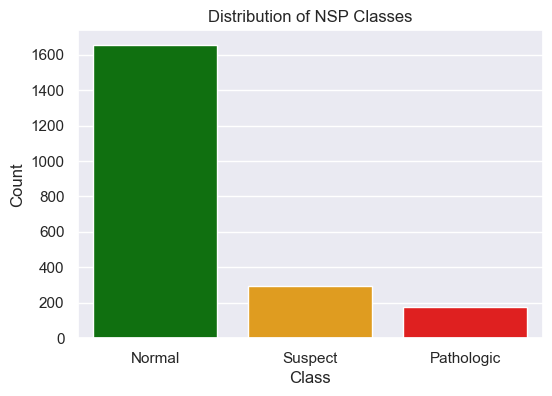

In [179]:
# Count NSP classes
counts = overall_df["NSP"].value_counts().sort_index()
labels = {1: "Normal", 2: "Suspect", 3: "Pathologic"}

# Bar chart
plt.figure(figsize=(6,4))
sb.barplot(x=[labels[k] for k in counts.index], y=counts.values, palette=["green","orange","red"])

plt.title("Distribution of NSP Classes")
plt.ylabel("Count")
plt.xlabel("Class")
plt.show()


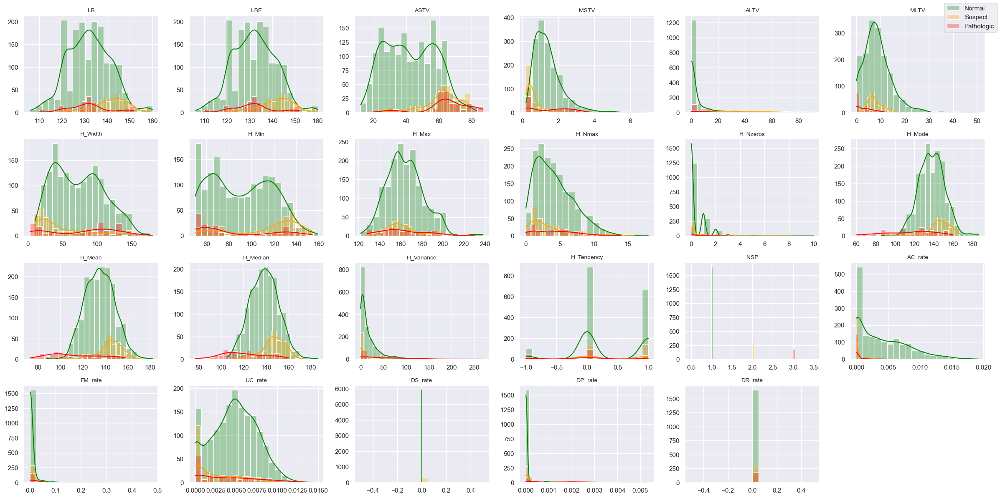

In [180]:
# Grid arrangement: 6 columns, enough rows for all features
n_features = len(overall_df.drop(columns=["H_Tendency","NSP"]).columns)
n_cols = 6
n_rows = (n_features + n_cols - 1) // n_cols  # ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows))
axes = axes.flatten()

for i, var in enumerate(overall_df.columns):
    ax = axes[i]

    # Normal - histogram + KDE
    sb.histplot(
        data=overall_df[overall_df["NSP"] == 1],
        x=var, bins=20, color="green", alpha=0.3, kde=True, ax=ax, label="Normal"
    )

    # Suspect - histogram + KDE
    sb.histplot(
        data=overall_df[overall_df["NSP"] == 2],
        x=var, bins=20, color="orange", alpha=0.3, kde=True, ax=ax, label="Suspect"
    )

    # Pathologic - histogram + KDE
    sb.histplot(
        data=overall_df[overall_df["NSP"] == 3],
        x=var, bins=20, color="red", alpha=0.3, kde=True, ax=ax, label="Pathologic"
    )

    ax.set_title(var, fontsize=10)
    ax.set_xlabel("")
    ax.set_ylabel("")

# Remove unused axes if features < grid slots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Put legend only once
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles[:3], labels[:3], loc="upper right")

plt.tight_layout()
plt.show()


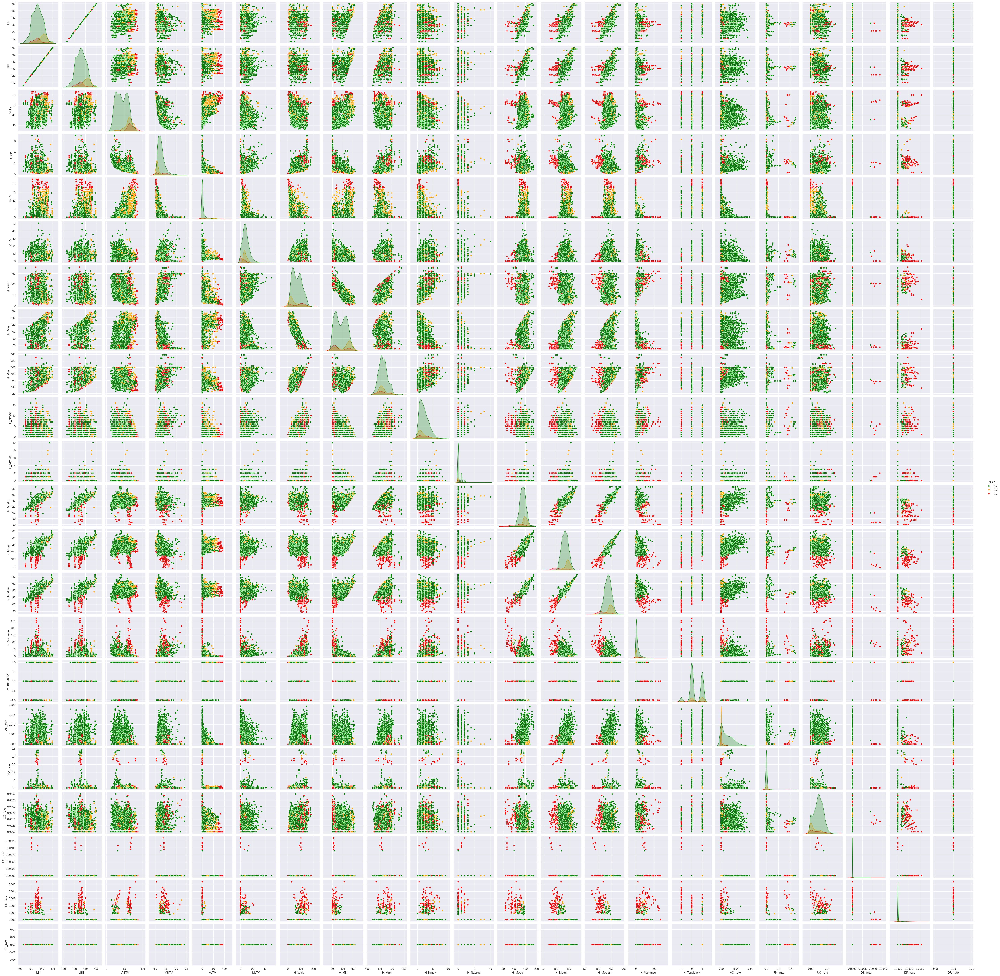

In [245]:
sb.pairplot(data = overall_df, hue="NSP", palette=["green","orange","red"])
plt.show()

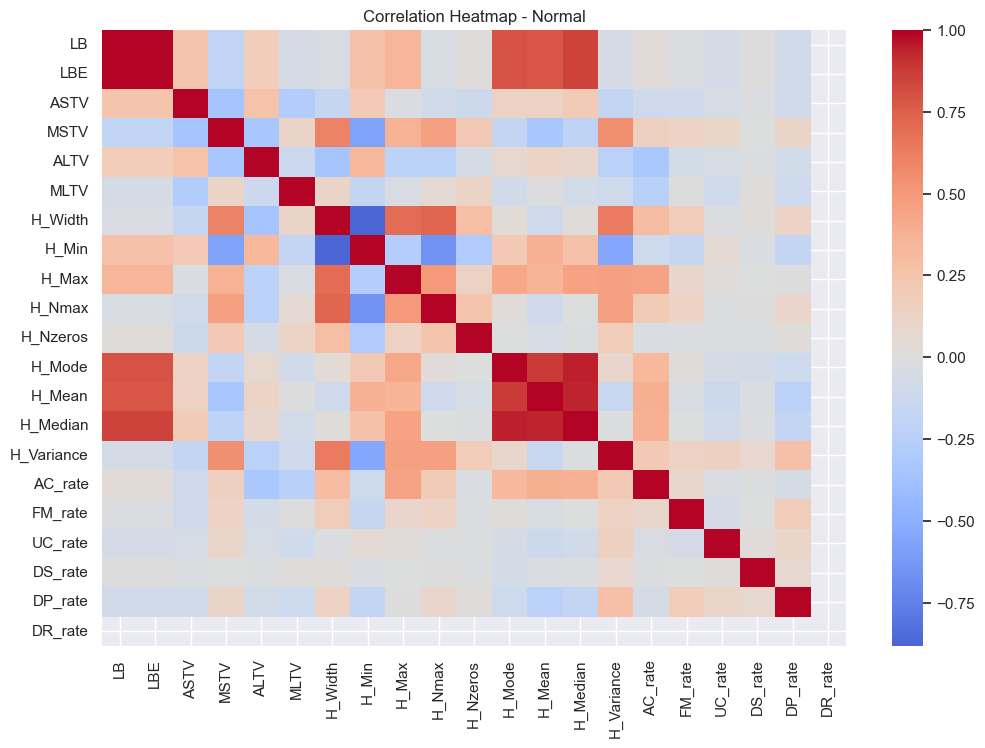

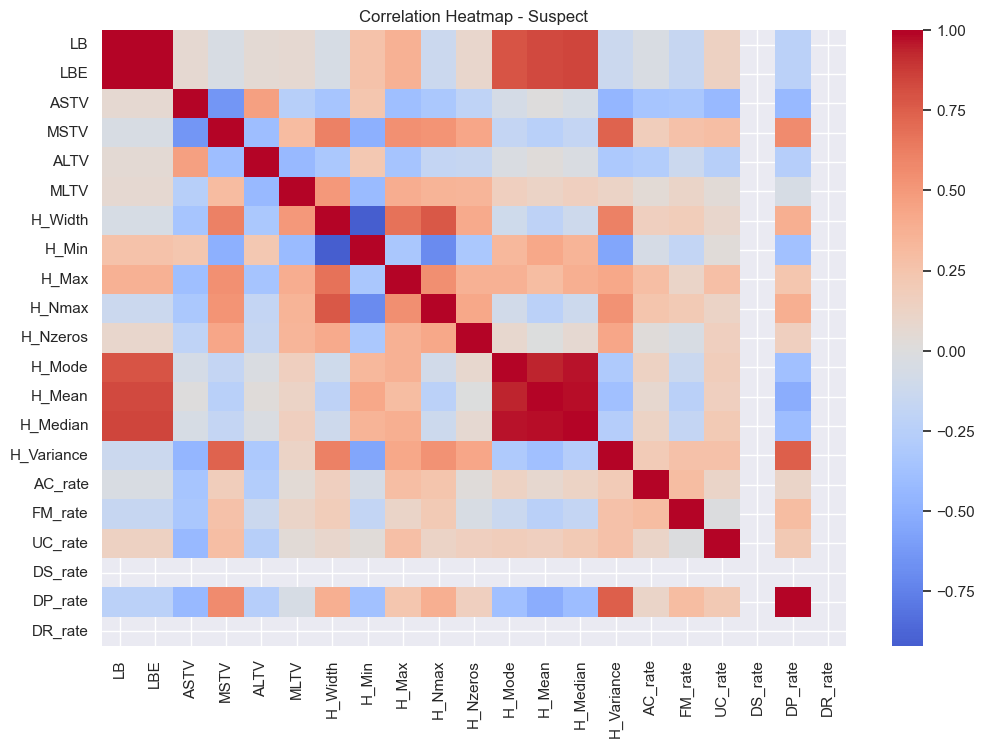

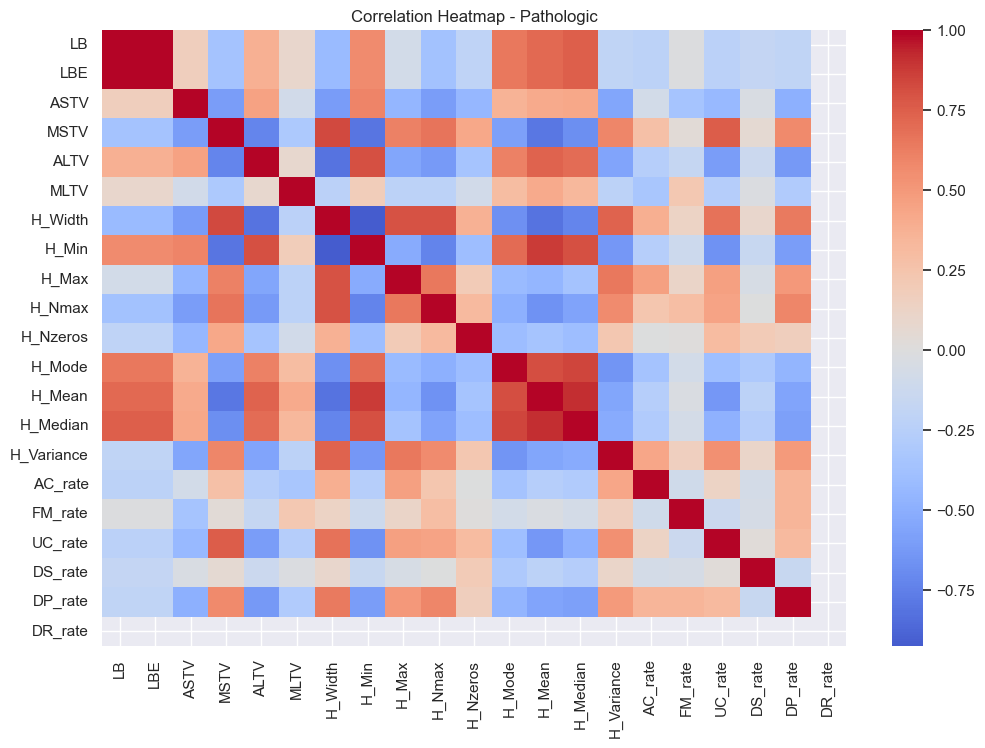

In [207]:
import seaborn as sb
import matplotlib.pyplot as plt

# Choose only numeric features (exclude NSP and non-numeric identifiers)
features = [col for col in overall_df.drop(columns=["H_Tendency", "NSP"]).columns]

# 2. Normal class only
plt.figure(figsize=(12,8))
sb.heatmap(normal_df[features].corr(), cmap="coolwarm", center=0, annot=False)
plt.title("Correlation Heatmap - Normal")
plt.show()

# 3. Suspect class only
plt.figure(figsize=(12,8))
sb.heatmap(suspect_df[features].corr(), cmap="coolwarm", center=0, annot=False)
plt.title("Correlation Heatmap - Suspect")
plt.show()

# 4. Pathologic class only
plt.figure(figsize=(12,8))
sb.heatmap(pathologic_df[features].corr(), cmap="coolwarm", center=0, annot=False)
plt.title("Correlation Heatmap - Pathologic")
plt.show()


In [208]:
from scipy.stats import kruskal
import pandas as pd
from tabulate import tabulate

results = []
skipped = []

# Loop through features (exclude NSP itself)
for col in overall_df.columns:
    if col == "NSP":
        continue

    # Extract values for each NSP class
    g1 = normal_df[col].dropna()
    g2 = suspect_df[col].dropna()
    g3 = pathologic_df[col].dropna()

    # Skip if any group has constant values
    if g1.nunique() <= 1 or g2.nunique() <= 1 or g3.nunique() <= 1:
        skipped.append(col)
        continue

    # Run Kruskal–Wallis test
    stat, p = kruskal(g1, g2, g3)
    results.append({"Feature": col, "chi-square": stat, "p": p})

# Convert to DataFrame
kw_results = pd.DataFrame(results).sort_values(by="chi-square", ascending=False)

# Show results
print(tabulate(kw_results, headers="keys", tablefmt="github", showindex=False))
print("\n skipped columns: ", skipped)


| Feature    |   chi-square |            p |
|------------|--------------|--------------|
| DP_rate    |    541.938   | 2.08718e-118 |
| ASTV       |    533.442   | 1.46041e-116 |
| ALTV       |    496.066   | 1.90814e-108 |
| AC_rate    |    452.919   | 4.4667e-99   |
| MSTV       |    383.308   | 5.83047e-84  |
| H_Mean     |    302.794   | 1.77502e-66  |
| H_Median   |    293.628   | 1.73603e-64  |
| H_Mode     |    268.716   | 4.45803e-59  |
| LBE        |    254.334   | 5.91759e-56  |
| LB         |    254.334   | 5.91759e-56  |
| H_Variance |    228.522   | 2.38302e-50  |
| UC_rate    |    175.726   | 6.94218e-39  |
| MLTV       |    165.624   | 1.0847e-36   |
| H_Min      |    162.488   | 5.20311e-36  |
| H_Width    |    126.237   | 3.87184e-28  |
| H_Tendency |     71.3415  | 3.22404e-16  |
| H_Nmax     |     38.77    | 3.81242e-09  |
| FM_rate    |     27.4878  | 1.07423e-06  |
| H_Nzeros   |     12.1941  | 0.00224951   |
| H_Max      |      8.81544 | 0.0121829    |

 skipped 

# **6 ML Techniques**

Our target variable are the NSP classes which makes this a classification problem. This rules out all regression based models (ie linear regression, decision tree regression, neural network regression, etc).

**DECISION TREE**

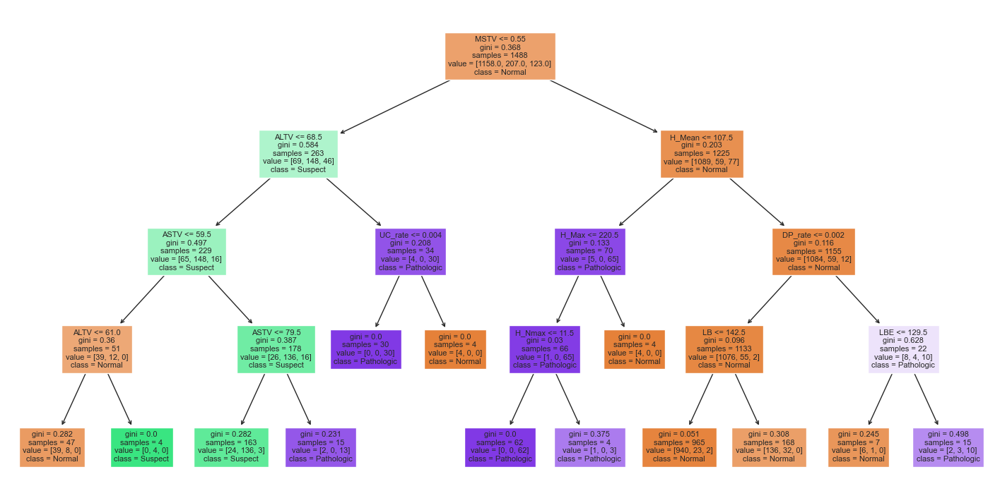

In [212]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import pandas as pd

# ================== DEFINE FEATURES AND TARGET ==================
X = overall_df.drop(columns=["NSP"])   # all predictors
y = overall_df["NSP"]                  # target labels

# ================== TRAIN/TEST SPLIT ==================
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# ================== TRAIN DECISION TREE ==================
dt = DecisionTreeClassifier(
    criterion="gini",     # or "entropy"
    max_depth=4,          # keep it interpretable
    random_state=42
)
dt.fit(X_train, y_train)

# ================== VISUALIZE TREE ==================
plt.figure(figsize=(18, 9))
plot_tree(
    dt,
    feature_names=X_train.columns,
    class_names=["Normal", "Suspect", "Pathologic"],
    filled=True,
    fontsize=8
)
plt.show()


In [213]:
from sklearn.metrics import confusion_matrix, classification_report

# ================== EVALUATE ==================
y_pred_dt = dt.predict(X_test)

print("\n==================== Decision Tree ====================\n")
print(classification_report(y_test, y_pred_dt, digits=3))

# Confusion matrix as DataFrame
cm = confusion_matrix(y_test, y_pred_dt)
cm_df = pd.DataFrame(
    cm,
    index=["Actual Normal", "Actual Suspect", "Actual Pathologic"],
    columns=["Pred Normal", "Pred Suspect", "Pred Pathologic"]
)

print("\nConfusion Matrix:")
display(cm_df)



==================== Decision Tree ====================

              precision    recall  f1-score   support

         1.0      0.924     0.960     0.942       497
         2.0      0.742     0.557     0.636        88
         3.0      0.857     0.906     0.881        53

    accuracy                          0.900       638
   macro avg      0.841     0.807     0.820       638
weighted avg      0.894     0.900     0.895       638


Confusion Matrix:


,Pred Normal,Pred Suspect,Pred Pathologic
Actual Normal,477,16,4
Actual Suspect,35,49,4
Actual Pathologic,4,1,48


The decision tree is generally able to provide good accuracy and precision. However, It struggles with Suspect cases, having a moderate recall of about 0.56. It can be seen that the decision tree is not always able to detect false negatives for when it is actually pathologic. This is worrisome as it means there are some pathologic cases which went unnoticed.

One major flaw in this dataset is the class inbalance among the NSP classes. thus, techniqures like SMOTE help to curb this.

**SMOTE (for class inbalance)**

Synthetic Minority Over-sampling Technique (SMOTE) is a method to address class-inbalances  by generating synthetic datapoints via K-Nearest-Neighbour (KNN).

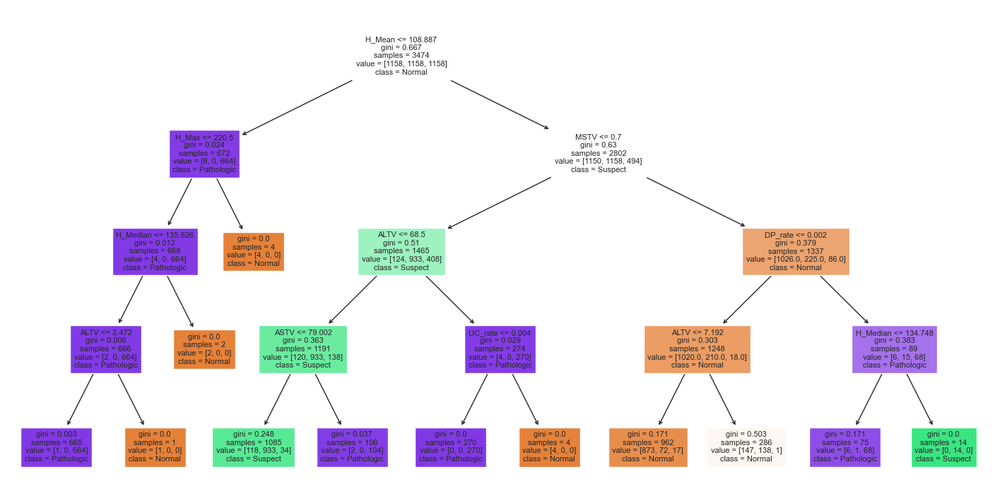

In [217]:
from imblearn.over_sampling import SMOTE
import seaborn as sns
import matplotlib.pyplot as plt

# Apply SMOTE to balance classes
smote = SMOTE(random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)

from sklearn.metrics import confusion_matrix, classification_report

# ================== TRAIN ON SMOTE DATA ==================
dt_sm = DecisionTreeClassifier(
    criterion="gini",
    max_depth=4,
    random_state=42
)
dt_sm.fit(X_train_sm, y_train_sm)

# ================== VISUALIZE TREE ==================
plt.figure(figsize=(18, 9))
plot_tree(
    dt_sm,
    feature_names=X_train_sm.columns,
    class_names=["Normal", "Suspect", "Pathologic"],
    filled=True,
    fontsize=8
)
plt.show()



In [218]:
# ================== EVALUATE ==================
y_pred_dt_sm = dt_sm.predict(X_test)

print("\n==================== Decision Tree (SMOTE) ====================\n")
print(classification_report(y_test, y_pred_dt_sm, digits=3))

# Confusion matrix as DataFrame
cm_sm = confusion_matrix(y_test, y_pred_dt_sm)
cm_df_sm = pd.DataFrame(
    cm_sm,
    index=["Actual Normal", "Actual Suspect", "Actual Pathologic"],
    columns=["Pred Normal", "Pred Suspect", "Pred Pathologic"]
)

print("\nConfusion Matrix (SMOTE):")
display(cm_df_sm)


==================== Decision Tree (SMOTE) ====================

              precision    recall  f1-score   support

         1.0      0.938     0.851     0.892       497
         2.0      0.469     0.693     0.560        88
         3.0      0.842     0.906     0.873        53

    accuracy                          0.834       638
   macro avg      0.750     0.817     0.775       638
weighted avg      0.865     0.834     0.845       638


Confusion Matrix (SMOTE):


,Pred Normal,Pred Suspect,Pred Pathologic
Actual Normal,423,68,6
Actual Suspect,24,61,3
Actual Pathologic,4,1,48


Without SMOTE: better overall accuracy, but poor performance on Suspect (minority) class.

With SMOTE: accuracy dropped, but Suspect detection improved — this is important because missing at-risk cases could be dangerous medically.

In [220]:
dt_sm = pd.Series(dt_sm.feature_importances_, index=X_train.columns).sort_values(ascending=False).head(15)
print("\n=== Top 15 Features (Decision Tree) ===")
print(dt)


=== Top 15 Features (Decision Tree) ===
DecisionTreeClassifier(max_depth=4, random_state=42)


From the decision tree it is seen that MSTV, H_Mean and ASTV are the top features affecting the decision tree. However, because a single decision tree only selects the most discriminative splits, many potentially relevant features are not used. Thus, more robust techniques can be employed to achieve better results.

**RANDOM FOREST AND XGBOOST COMPARISON**

In [223]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix

# ================== RANDOM FOREST WITH SMOTE ==================
rf_sm = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    class_weight=None  # SMOTE balances already
)
rf_sm.fit(X_train_sm, y_train_sm)

y_pred_rf_sm = rf_sm.predict(X_test)

print("\n==================== Random Forest (SMOTE) ====================\n")
print(classification_report(y_test, y_pred_rf_sm, digits=3))

cm_rf_sm = confusion_matrix(y_test, y_pred_rf_sm)
cm_df_rf_sm = pd.DataFrame(
    cm_rf_sm,
    index=["Actual Normal", "Actual Suspect", "Actual Pathologic"],
    columns=["Pred Normal", "Pred Suspect", "Pred Pathologic"]
)
print("\nConfusion Matrix (RF SMOTE):")
display(cm_df_rf_sm)



==================== Random Forest (SMOTE) ====================

              precision    recall  f1-score   support

         1.0      0.963     0.956     0.960       497
         2.0      0.758     0.784     0.771        88
         3.0      0.926     0.943     0.935        53

    accuracy                          0.931       638
   macro avg      0.883     0.894     0.888       638
weighted avg      0.932     0.931     0.931       638


Confusion Matrix (RF SMOTE):


,Pred Normal,Pred Suspect,Pred Pathologic
Actual Normal,475,20,2
Actual Suspect,17,69,2
Actual Pathologic,1,2,50



Top Features (Random Forest SMOTE):
ASTV          0.130732
ALTV          0.125128
H_Mean        0.095947
H_Median      0.076673
DP_rate       0.073225
MSTV          0.068162
AC_rate       0.060539
MLTV          0.059420
H_Mode        0.054468
H_Variance    0.041992
H_Width       0.031248
LBE           0.030067
LB            0.027355
H_Max         0.025701
H_Min         0.024116
dtype: float64


C:\Users\marcu\AppData\Local\Temp\ipykernel_29432\3943707006.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rf_importances.head(15), y=rf_importances.head(15).index, palette="viridis")


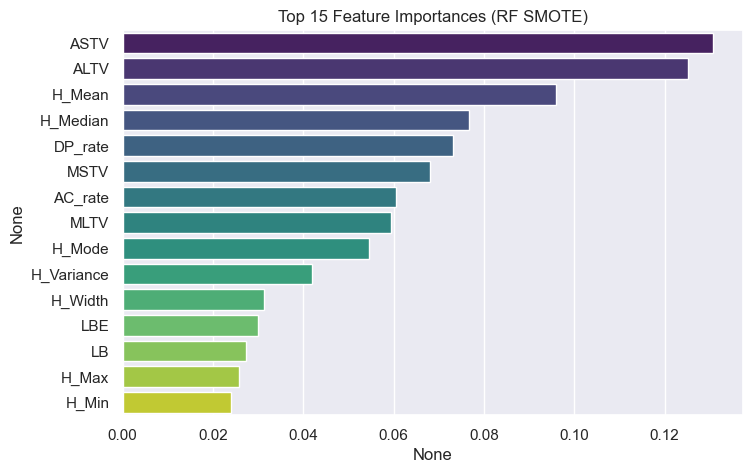

In [224]:
# Feature importance - RF
rf_importances = pd.Series(rf_sm.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print("\nTop Features (Random Forest SMOTE):")
print(rf_importances.head(15))

plt.figure(figsize=(8,5))
sns.barplot(x=rf_importances.head(15), y=rf_importances.head(15).index, palette="viridis")
plt.title("Top 15 Feature Importances (RF SMOTE)")
plt.show()

In [225]:
from sklearn.preprocessing import LabelEncoder

# Encode labels for XGBoost
le = LabelEncoder()
y_train_sm_enc = le.fit_transform(y_train_sm)   # for training
y_test_enc     = le.transform(y_test)          # for testing

# ================== XGBOOST WITH SMOTE ==================
xgb_sm = XGBClassifier(
    eval_metric="mlogloss",
    random_state=42,
    use_label_encoder=False
)

xgb_sm.fit(X_train_sm, y_train_sm_enc)

y_pred_xgb_sm = xgb_sm.predict(X_test)
y_pred_xgb_sm = le.inverse_transform(y_pred_xgb_sm)  # back to [1,2,3]

print("\n==================== XGBoost (SMOTE) ====================\n")
print(classification_report(y_test, y_pred_xgb_sm, digits=3))

cm_xgb_sm = confusion_matrix(y_test, y_pred_xgb_sm)
cm_df_xgb_sm = pd.DataFrame(
    cm_xgb_sm,
    index=["Actual Normal", "Actual Suspect", "Actual Pathologic"],
    columns=["Pred Normal", "Pred Suspect", "Pred Pathologic"]
)

print("\nConfusion Matrix (XGB SMOTE):")
display(cm_df_xgb_sm)


C:\Users\marcu\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [22:52:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



==================== XGBoost (SMOTE) ====================

              precision    recall  f1-score   support

         1.0      0.966     0.966     0.966       497
         2.0      0.819     0.773     0.795        88
         3.0      0.845     0.925     0.883        53

    accuracy                          0.936       638
   macro avg      0.877     0.888     0.881       638
weighted avg      0.936     0.936     0.935       638


Confusion Matrix (XGB SMOTE):


,Pred Normal,Pred Suspect,Pred Pathologic
Actual Normal,480,13,4
Actual Suspect,15,68,5
Actual Pathologic,2,2,49



Top Features (XGBoost SMOTE):
H_Mean        0.240712
ALTV          0.169424
ASTV          0.148830
DP_rate       0.116109
AC_rate       0.086601
H_Mode        0.029575
H_Median      0.027177
H_Min         0.025803
MSTV          0.023545
UC_rate       0.017459
LB            0.017439
FM_rate       0.016847
H_Variance    0.015254
H_Max         0.015000
H_Nmax        0.013198
dtype: float32


C:\Users\marcu\AppData\Local\Temp\ipykernel_29432\2352672906.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=xgb_importances.head(15), y=xgb_importances.head(15).index, palette="magma")


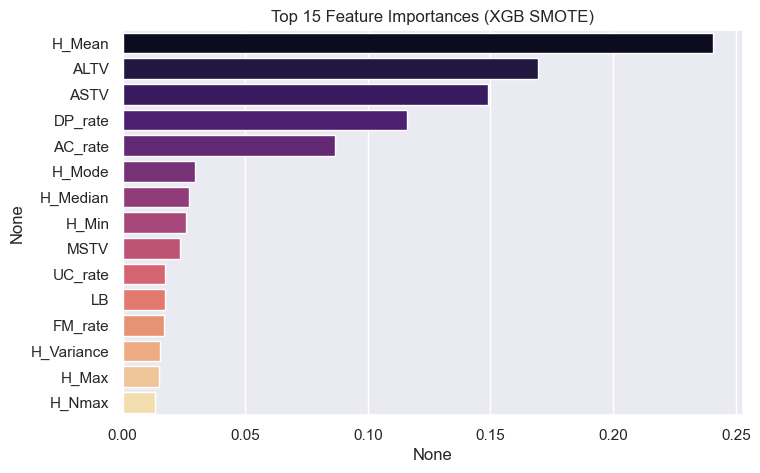

In [226]:
# Feature importance - XGB
xgb_importances = pd.Series(xgb_sm.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print("\nTop Features (XGBoost SMOTE):")
print(xgb_importances.head(15))

plt.figure(figsize=(8,5))
sns.barplot(x=xgb_importances.head(15), y=xgb_importances.head(15).index, palette="magma")
plt.title("Top 15 Feature Importances (XGB SMOTE)")
plt.show()


**HYPER-PARAMETERS**

We did some hyper-parameters to see which combinaiton gives best results. However, we omitted the code as it would take too long to load. Neevertheless, we have included them below.

**RANDOM FOREST+XGBOOST+NN**

We decided to mix the Random Forest, XGBoost and MLP together into 1 model for a more robust predictive model. The results at the end show an improvement as well.


=== Stacking Ensemble (RF + XGB + MLP) ===

              precision    recall  f1-score   support

         1.0      0.960     0.976     0.968       497
         2.0      0.859     0.761     0.807        88
         3.0      0.909     0.943     0.926        53

    accuracy                          0.944       638
   macro avg      0.909     0.894     0.900       638
weighted avg      0.942     0.944     0.942       638


Confusion Matrix (Stacking Ensemble):


,Pred Normal,Pred Suspect,Pred Pathologic
Actual Normal,485,10,2
Actual Suspect,18,67,3
Actual Pathologic,2,1,50


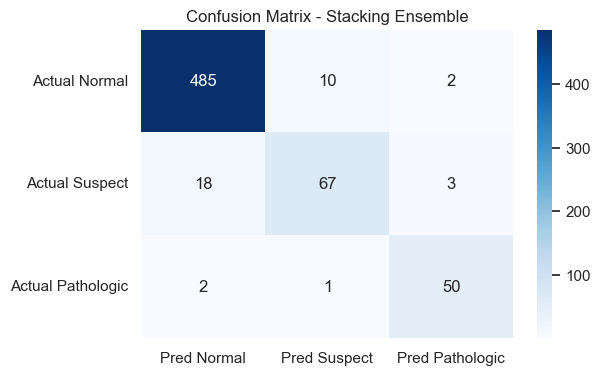

In [229]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ================== Base Models ==================
rf_best = RandomForestClassifier(
    n_estimators=500,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features=None,
    random_state=42
)

xgb_best = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric="mlogloss",
    random_state=42
)

mlp_best = Pipeline([
    ("scaler", StandardScaler()),
    ("mlp", MLPClassifier(
        hidden_layer_sizes=(128, 64),
        alpha=0.01,
        learning_rate_init=0.01,
        max_iter=500,
        activation="relu",
        solver="adam",
        random_state=42,
        early_stopping=True,
        validation_fraction=0.1
    ))
])

# ================== Ensemble (Stacking) ==================
stack_model = StackingClassifier(
    estimators=[
        ('rf', rf_best),
        ('xgb', xgb_best),
        ('mlp', mlp_best)
    ],
    final_estimator=LogisticRegression(max_iter=2000, class_weight="balanced"),
    cv=5,
    n_jobs=-1
)

# ================== Train on SMOTE ==================
stack_model.fit(X_train_sm, y_train_sm)

# ================== Evaluate ==================
y_pred_stack = stack_model.predict(X_test)

print("\n=== Stacking Ensemble (RF + XGB + MLP) ===\n")
print(classification_report(y_test, y_pred_stack, digits=3))

# Confusion Matrix
cm_stack = confusion_matrix(y_test, y_pred_stack)
cm_df_stack = pd.DataFrame(
    cm_stack,
    index=["Actual Normal", "Actual Suspect", "Actual Pathologic"],
    columns=["Pred Normal", "Pred Suspect", "Pred Pathologic"]
)

print("\nConfusion Matrix (Stacking Ensemble):")
display(cm_df_stack)

# Heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm_df_stack, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Stacking Ensemble")
plt.show()



=== Permutation Importances (Stacking Ensemble) ===
       Feature  Importance       Std
2         ASTV    0.081426  0.008915
16     AC_rate    0.048511  0.008167
4         ALTV    0.043103  0.004011
3         MSTV    0.035972  0.003918
18     UC_rate    0.025705  0.004660
12      H_Mean    0.020846  0.006762
13    H_Median    0.016693  0.003751
9       H_Nmax    0.010737  0.003549
20     DP_rate    0.010266  0.003556
8        H_Max    0.010188  0.003981
11      H_Mode    0.010188  0.004502
7        H_Min    0.007602  0.002442
14  H_Variance    0.006426  0.003321
5         MLTV    0.005956  0.004014
6      H_Width    0.005486  0.002826


C:\Users\marcu\AppData\Local\Temp\ipykernel_29432\1845958136.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


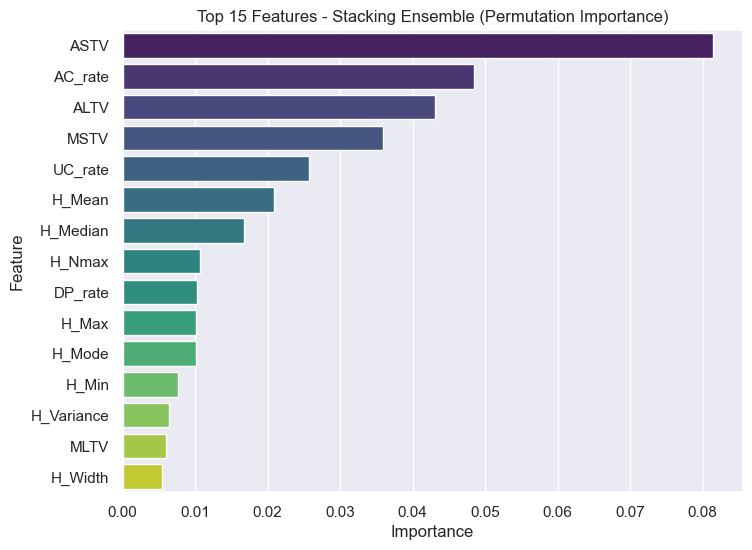

In [230]:
from sklearn.inspection import permutation_importance

# ================== PERMUTATION IMPORTANCE ==================
r = permutation_importance(
    stack_model, X_test, y_test,
    n_repeats=20, random_state=42, n_jobs=-1
)

# Put results in DataFrame
perm_importances = pd.DataFrame({
    "Feature": X_test.columns,
    "Importance": r.importances_mean,
    "Std": r.importances_std
}).sort_values(by="Importance", ascending=False)

print("\n=== Permutation Importances (Stacking Ensemble) ===")
print(perm_importances.head(15))  # top 15

# ================== VISUALIZE ==================
plt.figure(figsize=(8,6))
sns.barplot(
    data=perm_importances.head(15),
    x="Importance", y="Feature", palette="viridis"
)
plt.title("Top 15 Features - Stacking Ensemble (Permutation Importance)")
plt.show()


*   ASTV, AC_rate, and H_Mean are the most globally important features in the stacking model.

*   Compared to single models (like Decision Tree → MSTV, H_Mean, ALTV), the ensemble spreads importance more evenly across features, which is typical (it blends signals from RF, XGB, MLP).

*   Features at the bottom (e.g., H_Tendency, DS_rate, H_Nzeros) have very little effect in the final decision.



